<font face="Helvetica" color=#3c734d size=6>**Yelp Star Rating Predictor**</font><br>
<font face="helvetica" color=#3c734d size=3>Using NLP to Predict Star Ratings from Yelp Reviews</font><br>
Notebook Authored by: Katie McQuinn
<br>
<br>
<font face="helvetica" color=#3c734d size=5>**Background**</font><br>
Online reviews have become essential for both consumers and businesses. Platforms like Yelp host vast amounts of user-generated content that can provide insight into customer satisfaction and business performance. Natural Language Processing (NLP) offers tools to analyze this text data at scale, revealing patterns in sentiment and potentially predicting outcomes such as star ratings. Understanding these patterns can help businesses respond to customer needs and improve services.<br>


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<font face="Helvetica" size=4 color=#3c734d> Import Packages </font></br>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import nltk
import geopandas as gpd
import folium
from folium.plugins import HeatMap
import re

import nltk.corpus
from nltk.corpus import stopwords
from nltk.draw.dispersion import dispersion_plot
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model

In [ ]:
nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('wordnet')
palette = "mako"

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...



<font face="helvetica" color=#3c734d size=6>**Exploratory Data Analysis**</font><br>

<font face="helvetica" color=#3c734d size=4>Read Yelp Dataset</font><br>

In [ ]:
reviews_df = pd.read_csv("/content/drive/MyDrive/Data_Science/DTSA 5506: Data Science Project/Yelp Project/combined_review_restaurant_data.csv")

In [ ]:
# remove duplicates just in case
reviews_df = reviews_df.drop_duplicates()

In [ ]:
print(reviews_df.head())
print(reviews_df.info())

                review_id             business_id  stars_x  \
0  F6VdYuJiefNBfn3HNELv0A  z7em5co2qckbAXoDGXynsA        5   
1  nAMDCKElSKxOhzm9Lpt6Eg  M0r9lUn2gLFYgIwIfG8-bQ        5   
2  -4Nv_JAolCM0gzKM4DZpmQ  -3AooxIkg38UyUdlz5oXdw        4   
3  uObbDRxP_cwJVADckZJDZw  WLiqfxv_GhFFA5sm878a2w        5   
4  _Lq1_yzoOBDzjwPVWszdAg  720J1v3TX-J95cdTJbCpKA        5   

                                                text                 date  \
0  The food is INCREDIBLE! We didn't have time to...  2019-01-04 02:18:09   
1  We had a great time, and excellent service. Al...  2019-01-06 11:48:21   
2  Old school circa 1979, the cozy, intimate banq...  2019-02-17 20:28:26   
3  Delicious! Tried this place on Saturday and it...  2019-02-11 14:59:40   
4  Love this place! Took out of state company her...  2019-02-20 23:03:26   

               name                        address           city state  \
0     The Blue Duck               2661 Sutton Blvd      Maplewood    MO   
1    Baileys' 

<font face="helvetica" color=#3c734d size=4>Input Dataset Description</font><br>

This dataset contains ~967k Yelp reviews. Below is a table of the features and details of the dataset. <br>
<br>

Column Name | Description
----|----
`review_id`|Unique ID for each observation
`business_id`|Identifier linking the review to a business
`stars_x`|Star rating given in the review (1-5)
`text`|The raw review text (unprocessed)
`date`|Date the review wqas posted
`name`|Name of the business
`address, city, state, postal code`|Business location details
`latitude, longitude`|Geocoordinates of the business
`stars_y`|Average star rating for the business
`review_count`|Total number of reviews for the business
`is_open`|Business open status (0 or 1)
`categories`|Tags assigned to the business (i.e. "Mexican", "Pizza")

Cleaning up the columns a bit. Dropping `hours` and `attributes` and renaming  `stars_x` -> `stars` (this will be our target column) & `stars_y` -> `stars_avg`.

In [ ]:
def clean_input(data):
    data = data.drop(columns=['hours','attributes']) # dropping restaurant hours & attributes columns
    data.rename(columns={'stars_x': 'stars', 'stars_y': 'stars_avg'}, inplace=True)
    return data

reviews_df = clean_input(reviews_df)

Plotting histograms of star ratings

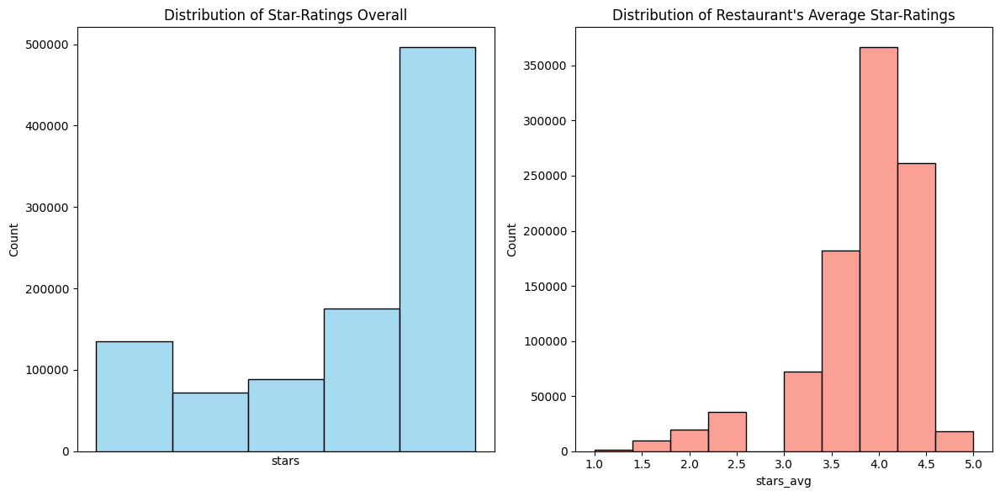

In [ ]:
# Set up the plotting environment
plt.figure(figsize=(12, 6))

# Distribution of 'stars'
plt.subplot(1, 2, 1)
sns.histplot(reviews_df['stars'], bins=5, kde=False, color='skyblue')
plt.xticks([])
plt.title('Distribution of Star-Ratings Overall')

# Distribution of 'stars_avg'
plt.subplot(1, 2, 2)
sns.histplot(reviews_df['stars_avg'], bins=10, kde=False, color='salmon')
plt.title("Distribution of Restaurant's Average Star-Ratings")

plt.tight_layout()
plt.show()

The majority of reviews overall are 5 stars (~51%)!

The majority (~38%) of restaurants in this dataset have 4 stars! Important to note that this is a graph of the <i>average</i> star-rating of the included restaurants.

In [ ]:
stars_count = reviews_df['stars'].value_counts().sort_index()
avg_stars_count = reviews_df['stars_avg'].value_counts().sort_index()

print(f"Overall star-ratings: \n{stars_count}\n\n Restaurant avg:\n {avg_stars_count} years old.")

Overall star-ratings: 
stars
1    134550
2     72366
3     88086
4    175506
5    496121
Name: count, dtype: int64

 Restaurant avg:
 stars_avg
1.0       980
1.5     10072
2.0     19328
2.5     35744
3.0     72403
3.5    181809
4.0    366432
4.5    261551
5.0     18310
Name: count, dtype: int64 years old.


Bounding boxes created by hand to be able to feature-engineer a metro area column

In [ ]:
bounding_boxes = {
    'philly': {'lat_min': 39.87, 'lat_max': 40.15, 'lon_min': -75.28, 'lon_max': -74.95},
    'stlouis': {'lat_min': 38.52, 'lat_max': 38.78, 'lon_min': -90.37, 'lon_max': -90.04},
    'santabarbara': {'lat_min': 34.38, 'lat_max': 34.50, 'lon_min': -119.89, 'lon_max': -119.63},
    'reno': {'lat_min': 39.40, 'lat_max': 39.62, 'lon_min': -119.90, 'lon_max': -119.67},
    'boise': {'lat_min': 43.52, 'lat_max': 43.72, 'lon_min': -116.35, 'lon_max': -116.10},
    'tucson': {'lat_min': 32.10, 'lat_max': 32.32, 'lon_min': -111.07, 'lon_max': -110.71},
    'edmonton': {'lat_min': 53.40, 'lat_max': 53.75, 'lon_min': -113.72, 'lon_max': -113.27},
    'nola': {'lat_min': 29.86, 'lat_max': 30.11, 'lon_min': -90.15, 'lon_max': -89.73},
    'nashville': {'lat_min': 36.04, 'lat_max': 36.28, 'lon_min': -86.93, 'lon_max': -86.60},
    'indianapolis': {'lat_min': 39.64, 'lat_max': 39.92, 'lon_min': -86.32, 'lon_max': -85.99},
    'tampa': {'lat_min': 27.84, 'lat_max': 28.08, 'lon_min': -82.60, 'lon_max': -82.34},
}

def assign_city(lat, lon):
    for city, bbox in bounding_boxes.items():
        if bbox['lat_min'] <= lat <= bbox['lat_max'] and bbox['lon_min'] <= lon <= bbox['lon_max']:
            return city
    return None  # Returning None to mark as an entry to omit

# Apply the function to the Yelp reviews DataFrame
reviews_df['metro_area'] = reviews_df.apply(lambda row: assign_city(row['latitude'], row['longitude']), axis=1)

# Filter out rows where 'City' is None
reviews_df = reviews_df[reviews_df['metro_area'].notnull()]

# Turn stars variable into a category
reviews_df['stars'] = reviews_df['stars'].astype('category')

<ipython-input-10-49012729b01c>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reviews_df['stars'] = reviews_df['stars'].astype('category')


In [ ]:
def city_map(city):
    lat = (bounding_boxes[city]['lat_max']+bounding_boxes[city]['lat_min'])/2
    lon = (bounding_boxes[city]['lon_max']+bounding_boxes[city]['lon_min'])/2
    location = [lat, lon]

    map = folium.Map(location=location, zoom_start=10)
    map_df = reviews_df[reviews_df['metro_area']==city]

        # Add scatter points to the map
    for _, row in map_df.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,  # Size of the marker
            popup=f"Value: {row['stars_avg']}",  # Tooltip information
            color = None,
            fill=True,
            fill_color="blue",  # Fill color of the circle
            fill_opacity=0.1
        ).add_to(map)

    return map


In [ ]:
city_map('edmonton')

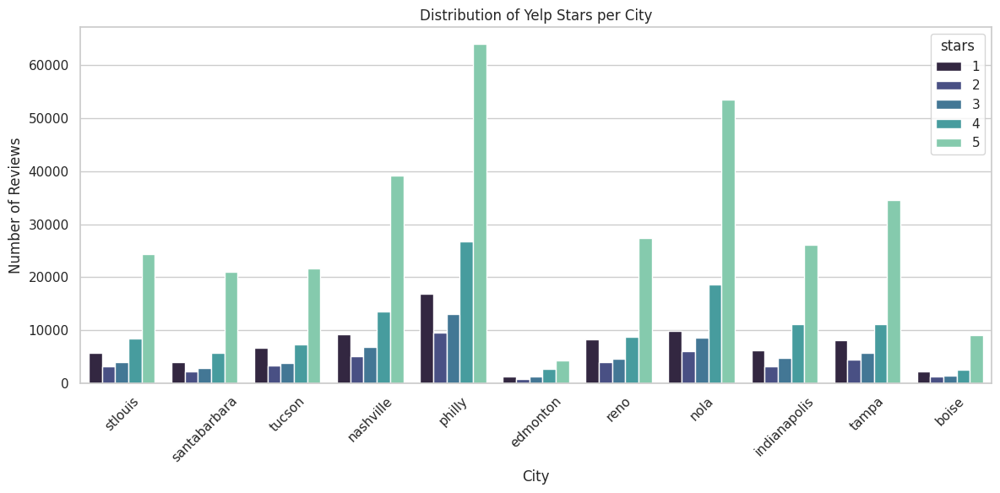

In [ ]:
sns.set(style="whitegrid")

# Bar Plot - Distribution of Star Ratings per City
plt.figure(figsize=(12, 6))
sns.countplot(data=reviews_df, x='metro_area', hue='stars',palette=palette)
plt.title('Distribution of Yelp Stars per City')
plt.ylabel('Number of Reviews')
plt.xlabel('City')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Interesting the see the number of reviews by city, but next I'll normalize the values so more dense places like Philly have the same visual weight as less-dense metro areas Boise or Edmonton.

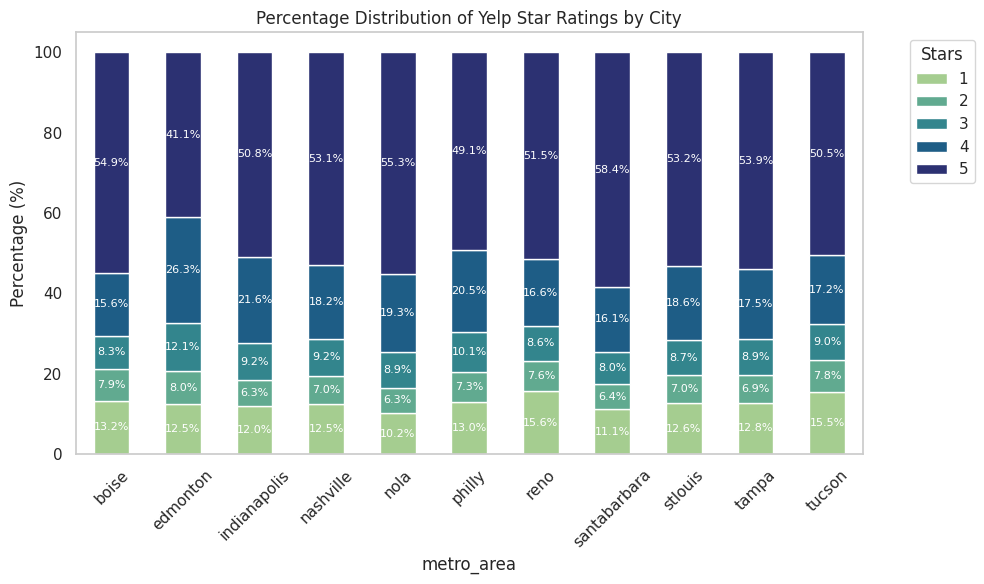

In [ ]:
# Calculate the percentage of star ratings per city
# Group by City and Stars, and calculate the count for each star rating in each city
city_star_counts = reviews_df.groupby(['metro_area', 'stars'], observed=False).size().reset_index(name='count')

# Calculate the total number of reviews per city
city_star_totals = city_star_counts.groupby('metro_area')['count'].transform('sum')

# Calculate percentage of each star rating within each city
city_star_counts['percentage'] = (city_star_counts['count'] / city_star_totals) * 100

# Pivot the data to get one row per city, and star ratings as separate columns
city_star_pivot = city_star_counts.pivot(index='metro_area', columns='stars', values='percentage').fillna(0)

# Plot the stacked bar chart
ax = city_star_pivot.plot(kind='bar', stacked=True, figsize=(10, 6), cmap='crest')

# Add annotations (values on top of each bar segment)
for container in ax.containers:
    # Loop through each bar in the container
    for bar in container:
        height = bar.get_height()
        if height > 0:
            ax.annotate(
                f'{height:.1f}%',  # Format as percent with 1 decimal
                xy=(bar.get_x() + bar.get_width() / 2, bar.get_y() + height / 2),
                ha='center',
                va='center',
                fontsize=8,
                color='white'
            )

# Customize the plot
plt.title('Percentage Distribution of Yelp Star Ratings by City')
plt.xlabel('metro_area')
plt.ylabel('Percentage (%)')
plt.xticks(rotation=45)
plt.legend(title='Stars', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.xaxis.grid(False)
ax.yaxis.grid(False)

plt.tight_layout()
plt.show()

Looks like Boise (55%) & Santa Barbara (58%) have the largest percentages of 5-star reviews.
<br>
<br>

Below is an example of what an unformatted piece of review text (and its corresponding star rating) looks like:

In [ ]:
review_text = reviews_df['text'][1]
review_rating = reviews_df['stars'][1]

print(f"Stars: {review_rating} \n Text: {review_text}")

Stars: 5 
 Text: We had a great time, and excellent service. All food items were fresh, unique, and high quality. Nothing appeared to be pre-made,
Except for the ice cream which was exceptionally good. The waitress was very sweet and friendly


Helper function to clean text. This will remove numbers, punctuation, and stop words (and, the, or).

In [ ]:
def clean_text(df):
    stop_words = set(stopwords.words('english'))

    def preprocess(text):
        # Remove non-ASCII characters (e.g., emojis, Chinese characters)
        text = re.sub(r'[^\x00-\x7F]+', '', text)
        # Convert to lowercase
        text = text.lower()
        # Keep only English letters and spaces
        text = re.sub(r'[^a-zA-Z\s]', '', text)
        # Remove stopwords
        text = ' '.join([word for word in text.split() if word not in stop_words])
        return text

    df['clean'] = df['text'].astype(str).apply(preprocess)
    return df

In [ ]:
clean_text(reviews_df)

,review_id,business_id,stars,text,date,name,address,city,state,postal_code,latitude,longitude,stars_avg,review_count,is_open,categories,metro_area,clean
0,F6VdYuJiefNBfn3HNELv0A,z7em5co2qckbAXoDGXynsA,5,The food is INCREDIBLE! We didn't have time to...,2019-01-04 02:18:09,The Blue Duck,2661 Sutton Blvd,Maplewood,MO,63143,38.612945,-90.319886,4.0,278,1,"Salad, Soup, Sandwiches, Restaurants, Comfort ...",stlouis,food incredible didnt time get cocktails prett...
1,nAMDCKElSKxOhzm9Lpt6Eg,M0r9lUn2gLFYgIwIfG8-bQ,5,"We had a great time, and excellent service. Al...",2019-01-06 11:48:21,Baileys' Range,920 Olive St,Saint Louis,MO,63101,38.628864,-90.194542,3.5,1567,1,"Ice Cream & Frozen Yogurt, Burgers, Food, Nigh...",stlouis,great time excellent service food items fresh ...
2,-4Nv_JAolCM0gzKM4DZpmQ,-3AooxIkg38UyUdlz5oXdw,4,"Old school circa 1979, the cozy, intimate banq...",2019-02-17 20:28:26,Chase Restaurant,1012 State St,Santa Barbara,CA,93101,34.421931,-119.702185,3.0,436,1,"Event Planning & Services, Restaurants, Nightl...",santabarbara,old school circa cozy intimate banquettes boot...
3,uObbDRxP_cwJVADckZJDZw,WLiqfxv_GhFFA5sm878a2w,5,Delicious! Tried this place on Saturday and it...,2019-02-11 14:59:40,Wei Asian Cafe,"9450 E Golf Links Rd, Ste 102",Tucson,AZ,85730,32.190395,-110.791514,4.0,109,1,"Chinese, Restaurants",tucson,delicious tried place saturday good craving au...
4,_Lq1_yzoOBDzjwPVWszdAg,720J1v3TX-J95cdTJbCpKA,5,Love this place! Took out of state company her...,2019-02-20 23:03:26,Ninki,4530 HardIng Rd,Nashville,TN,37205,36.124488,-86.848808,3.5,213,1,"Sushi Bars, Steakhouses, Restaurants, Japanese",nashville,love place took state company great lunch spec...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966624,ZcEx4UEnTnR_TEPEqwkKjA,Ea663rIHyKXz2VP2DPH7Cg,4,I decided to try this place out after Christma...,2020-01-13 04:21:38,Tinsel,116 S 12th St,Philadelphia,PA,19107,39.949776,-75.160460,3.0,79,1,"Pop-Up Restaurants, Nightlife, Bars, Restaurants",philly,decided try place christmas beat crowd definit...
966625,SOkAlzzMF0TOuJcOaT98Xg,M9EMOYyem3oWU1VLl2NiKg,1,I'm so sad that this Pho Hoa closed during COV...,2020-10-19 05:25:11,Pho Hoa,1308 Manhattan Blvd,Harvey,LA,70058,29.895550,-90.061670,4.0,119,0,"Restaurants, Vietnamese",nola,im sad pho hoa closed covid another pho restau...
966626,_USUb1lBWnO4VV58FHL6fw,6aUb_f9C7a2oOxaIfRGSdA,4,I ordered a half rack of Pork Ribs (a la carte...,2019-04-29 18:10:03,Chicken in a Barrel BBQ-Goleta,5711 Calle Real,Goleta,CA,93117,34.440818,-119.823762,4.0,116,0,"Barbeque, Restaurants, Chicken Shop, Hawaiian",santabarbara,ordered half rack pork ribs la carte delicious...
966627,pJvL9AN6gDoixiLLNF1c7w,r2IhvKZQ_wLR5mLBnPOilg,4,One of my favorite restaurants in Santa Barbar...,2019-03-27 04:16:27,The Honor Bar,"1255 Coast Village Rd, Ste 101",Santa Barbara,CA,93108,34.421044,-119.641903,4.5,557,1,"Restaurants, Sandwiches, Nightlife, Bars, Amer...",santabarbara,one favorite restaurants santa barbara reason ...


In [ ]:
reviews_df['clean'][1]

'great time excellent service food items fresh unique high quality nothing appeared premade except ice cream exceptionally good waitress sweet friendly'

As you can see here the review text is a little shorter and has removed a lot of "unnecessary" words.
<br>
<br>

Now it's time to tokenize and lemmatize the words in these reviews. This makes the text machine-readable and is foundational to NLP.

Tokenizing just breaks each sentences into individual words. Lemmatizing then takes those words and breaks them down to their root form.
<br>
e.g. "Running" -> "Run",
<br>
"are" -> "be",
<br>
"cats" -> "cat".

In [ ]:
lemmatizer = WordNetLemmatizer()

def lemmatize(str):
    lem = [lemmatizer.lemmatize(word) for word in str]
    return lem

def tokenize_lemmatize(dataframe, column):
    dataframe['tokenized'] = dataframe.apply(lambda row: word_tokenize(row[column]), axis=1)
    dataframe['lemmatized'] = dataframe['tokenized'].apply(lambda str: lemmatize(str))

In [ ]:
tokenize_lemmatize(reviews_df, 'clean')

In [ ]:
print(reviews_df['lemmatized'][1])

['great', 'time', 'excellent', 'service', 'food', 'item', 'fresh', 'unique', 'high', 'quality', 'nothing', 'appeared', 'premade', 'except', 'ice', 'cream', 'exceptionally', 'good', 'waitress', 'sweet', 'friendly']


Now that our reviews are cleaned, tokenize, and lemmatized, I'm gonna dive a little deeper into the analysis. I'm going to count the number of words in each review to get an idea of typical review length and to see if I need to delete any wildly long reviews that might skew the analysis.

In [ ]:
# Create variable for article length to analyze whether or not we need to pare down any of the data
reviews_df['review_len'] = reviews_df['lemmatized'].apply(lambda lemmatized_str: len(lemmatized_str))

In [ ]:
print(reviews_df['review_len'])

0         156
1          21
2          13
3          13
4          23
         ... 
966624     48
966625     26
966626     26
966627     81
966628     34
Name: review_len, Length: 621123, dtype: int64


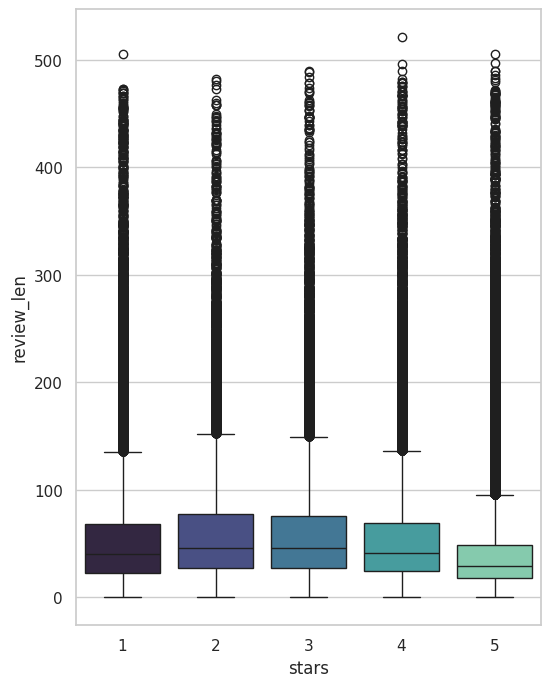

In [ ]:
fig, ax = plt.subplots(figsize=(6,8))
sns.color_palette(palette)
ax = sns.boxplot(
    x = reviews_df['stars'],
    y = reviews_df['review_len'],
    hue = reviews_df['stars'],
    legend = False,
    palette = palette,
    native_scale = True
)

There aren't many dramatically long reviews, so I'm not going to delete any of them. It's also interesting to see that the shortest reviews are also, on average, the ones with the higheset ratings.

------------------------------

Even though I'm going to be using LSTM to model my data, I'm also going to process this data using TF-IDF and Non-Negative Matric factorization to see if we can get some more clues into our data.

* **TF-IDF** (Term Frequency-Inverse Document Frequency) transforms raw text into numerical features that reflect how important a word is to a document, while down-weighting common words across all documents.

* **NMF** is an unsupervised topic modeling technique that decomposes the TF-IDF matrix into a set of interpretable topics, where each topic is a group of keywords that frequently occur together in the dataset.

This combination allows us to uncover latent topics and themes in the reviews without relying on labels, providing insight into what people are actually talking about in different star ratings or cities.

First we'll prepare our lemmatized data to be vectorized with TF-IDF.

In [ ]:
# create string of lemmatized words
reviews_df["lemmatized_str"]=reviews_df['lemmatized'].apply(lambda words: ' '.join(words))

Let's check some stats on our squeaky-clean dataframe.

In [ ]:
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 621123 entries, 0 to 966628
Data columns (total 22 columns):
 #   Column          Non-Null Count   Dtype   
---  ------          --------------   -----   
 0   review_id       621123 non-null  object  
 1   business_id     621123 non-null  object  
 2   stars           621123 non-null  category
 3   text            621123 non-null  object  
 4   date            621123 non-null  object  
 5   name            621123 non-null  object  
 6   address         620034 non-null  object  
 7   city            621123 non-null  object  
 8   state           621123 non-null  object  
 9   postal_code     621121 non-null  object  
 10  latitude        621123 non-null  float64 
 11  longitude       621123 non-null  float64 
 12  stars_avg       621123 non-null  float64 
 13  review_count    621123 non-null  int64   
 14  is_open         621123 non-null  int64   
 15  categories      621123 non-null  object  
 16  metro_area      621123 non-null  object  
 

The code below applies TF-IDF to our dataset. The output `X_tfidf` is a very large sparse matrix.

In [ ]:
tfidf = TfidfVectorizer(max_features=5000, stop_words='english')
X_tfidf = tfidf.fit_transform(reviews_df['lemmatized_str'])

Then I'll apply non-negative matrix factorization (NMF).

NMF factorizes the matrix:<br>
`X_tfidf ≈ W x H`<br>
where:<br>

`W` = how much each topic is present in each review (document-topic matrix)

`H` = how much each word contributes to each topic (topic-word matrix)

In [ ]:
nmf = NMF(n_components=10 random_state=42)
W = nmf.fit_transform(X_tfidf)  # Document-topic matrix
H = nmf.components_             # Topic-word matrix

And below I'll display the top words for 10 'topics' that came from my TF-IDF matrix.

In [ ]:
feature_names = tfidf.get_feature_names_out()

for topic_idx, topic in enumerate(H):
    top_words = [feature_names[i] for i in topic.argsort()[-10:]]
    print(f"Topic {topic_idx+1}: {' '.join(top_words)}")

Topic 1: meal like sauce salad shrimp ordered menu delicious restaurant dish
Topic 2: beer server experience awesome drink excellent atmosphere food service great
Topic 3: wing delivery pie sauce pepperoni topping cheese slice crust pizza
Topic 4: didnt said came drink wait table food minute time order
Topic 5: like little service price place nice pretty food really good
Topic 6: time highly favorite recommend ive food love best amazing place
Topic 7: clean spot sandwich nice delicious super coffee breakfast friendly staff
Topic 8: rice spicy sauce mac wing cheese hot fried sandwich chicken
Topic 9: pastor asada tortilla burrito margarita fish chip mexican salsa taco
Topic 10: got shake patty bacon onion bun beer cheese fry burger


Cool to see these words grouped together because they just seem... right.
<br>
<br>
Even though I intend to eventually utilize an LSTM model, I will try to fit a Logistic regression model since I've already prepared the matrix!

In [ ]:
text_data = reviews_df['lemmatized_str']
target = reviews_df['stars']

#splitting up into test/train data
X_train, X_test, y_train, y_test = train_test_split(
    text_data, target, test_size=0.2, random_state=42, stratify=target
)

# fitting the existing vectorizer on train & test data
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

In [ ]:
# apply NMF again
X_train_nmf = nmf.fit_transform(X_train_tfidf)
X_test_nmf = nmf.transform(X_test_tfidf)

In [ ]:
# Train logistic regression on NMF features
log_reg = LogisticRegression(max_iter=200)
log_reg.fit(X_train_nmf, y_train)

LogisticRegression(max_iter=200)

Classification Report:
              precision    recall  f1-score   support

           1       0.55      0.59      0.57     15709
           2       0.00      0.00      0.00      8693
           3       0.27      0.01      0.02     11407
           4       0.39      0.12      0.19     23410
           5       0.62      0.94      0.75     65006

    accuracy                           0.59    124225
   macro avg       0.37      0.33      0.30    124225
weighted avg       0.49      0.59      0.50    124225

Accuracy Score: 0.5927148319581405


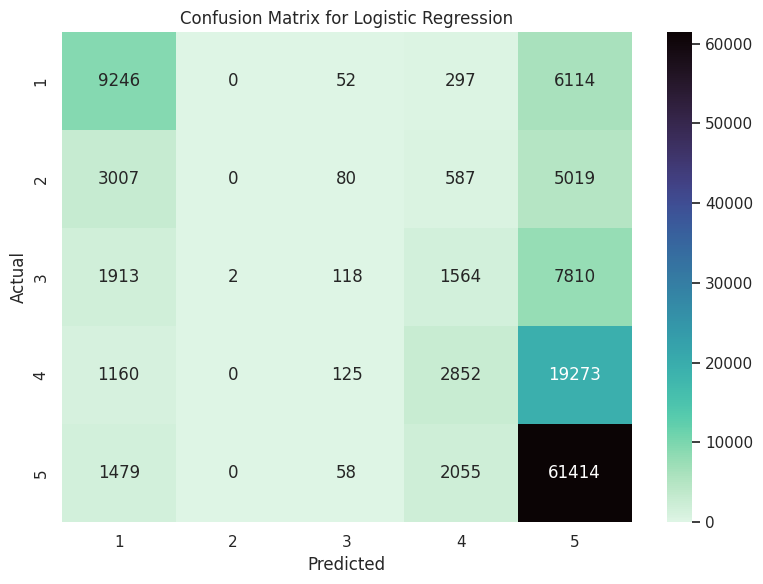

In [ ]:
#Predict and evaluate
y_pred = log_reg.predict(X_test_nmf)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Accuracy
print("Accuracy Score:", accuracy_score(y_test, y_pred))

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='mako_r',
            xticklabels=sorted(y_test.unique()),
            yticklabels=sorted(y_test.unique()))

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.tight_layout()
plt.show()


As you can see, the model does really well at interpreting 1 & 5 star reviews. This is not surprising as the verbiage in those reviews are probably obvious as they are on either end of the spectrum. The 5 star reviews even have a 94% recall rate after just a simple logreg!

<font face="helvetica" color=#3c734d size=5>**LSTM Modeling**</font><br>

<br>
<br>

<font face="helvetica" size=4>Prepare data for LSTM</font><br>


In [ ]:
# Tokenization and Padding
tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(X_train)

X_train_sequences = tokenizer.texts_to_sequences(X_train)
X_test_sequences = tokenizer.texts_to_sequences(X_test)

max_sequence_length = 200
X_train_padded = pad_sequences(X_train_sequences, maxlen=max_sequence_length)
X_test_padded = pad_sequences(X_test_sequences, maxlen=max_sequence_length)

# One-hot encode the labels
y_train_encoded = pd.get_dummies(y_train).values
y_test_encoded = pd.get_dummies(y_test).values

Read in GloVe dataset

- We are trying to beef up our dataset by employing a pre-existing word vectors.
- This gives our model a "headstart" regarding word relationships

In [ ]:
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove.6B.zip

--2025-04-20 11:34:20--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2025-04-20 11:34:20--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2025-04-20 11:34:20--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

Storing GloVe word embeddings into Python dictionary

In [ ]:
embedding_dim = 100
embedding_index = {}

with open('glove.6B.100d.txt', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        vector = np.asarray(values[1:], dtype='float32')
        embedding_index[word] = vector

print(f"Loaded {len(embedding_index)} word vectors from GloVe.")

Loaded 400000 word vectors from GloVe.


Create embedding matrix to feed into LSTM model

In [ ]:
word_index = tokenizer.word_index
num_words = min(5000, len(word_index) + 1)

embedding_matrix = np.zeros((num_words, embedding_dim))
for word, i in word_index.items():
    if i >= 5000:
        continue
    embedding_vector = embedding_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector


<font face="helvetica" color=#3c734d size=5>**LSTM Model Building**</font><br>

<br>

<font face ="helvetica" color=#3c734d size=4>**Model Architecture**:</font><br>
<br>

**Embedding Layer**
* Initialized with pretrained GloVe embeddings (100-dimensional), this layer converts each word index in the input sequence into a dense vector representing its semantic meaning. The embeddings are frozen (trainable=False) to preserve their pretrained knowledge during training.

**LSTM Layer**
* A Long Short-Term Memory (LSTM) layer with 64 units captures sequential dependencies in the text — such as grammar, word order, and sentiment flow. Dropout and recurrent dropout are used to prevent overfitting.

**Dense + Dropout Layer**
* A fully connected layer with ReLU activation further processes the LSTM output, followed by a dropout layer (50%) to regularize the model and reduce overfitting.

**Output Layer**
* A softmax layer outputs probabilities across all possible star ratings (1 to 5), making this a multi-class classification problem.

**Compilation**
* The model is compiled using the Adam optimizer and categorical crossentropy loss, appropriate for multi-class, one-hot encoded targets. The model is evaluated using accuracy.

In [ ]:
model = Sequential([
    Embedding(
        input_dim=num_words,
        output_dim=embedding_dim,
        input_length=max_sequence_length,
        weights=[embedding_matrix],
        trainable=False  # set to True to fine-tune later
    ),
    LSTM(units=64, dropout=0.2, recurrent_dropout=0.2),
    Dense(units=32, activation='relu'),
    Dropout(0.5),
    Dense(units=y_train_encoded.shape[1], activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(



<font face="helvetica" color=#3c734d size=5>**LSTM Model Training**</font><br>
- Here, I use early stopping so as to avoid overfitting
- This is a computationally expensive process, so I will start with 10 epochs running on an A100
- I also save the model just in case my notebook times out
<br>
<br>

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Train the Model
history = model.fit(
    X_train_padded,
    y_train_encoded,
    batch_size=32,
    epochs=10,
    validation_data=(X_test_padded, y_test_encoded),
    callbacks=[early_stopping],
    verbose=1
)
# Evaluate the Model
test_loss, test_accuracy = model.evaluate(X_test_padded, y_test_encoded)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


model.save("/content/drive/MyDrive/Data_Science/DTSA 5506: Data Science Project/Yelp Project/yelp_lstm_model_with_GloVe.keras")

Epoch 1/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6397s 412ms/step - accuracy: 0.6836 - loss: 0.7780 - val_accuracy: 0.7128 - val_loss: 0.6936
Epoch 2/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6384s 411ms/step - accuracy: 0.6946 - loss: 0.7489 - val_accuracy: 0.7177 - val_loss: 0.6849
Epoch 3/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6393s 412ms/step - accuracy: 0.6969 - loss: 0.7430 - val_accuracy: 0.7154 - val_loss: 0.6812
Epoch 4/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6416s 413ms/step - accuracy: 0.7000 - loss: 0.7340 - val_accuracy: 0.7160 - val_loss: 0.6788
Epoch 5/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6405s 412ms/step - accuracy: 0.7017 - loss: 0.7296 - val_accuracy: 0.7219 - val_loss: 0.6715
Epoch 6/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6404s 412ms/step - accuracy: 0.7034 - loss: 0.7261 - val_accuracy: 0.7210 - val_loss: 0.6735
Epoch 7/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 6372s 410ms/step - accuracy: 0.7036 - loss: 0.7244 - val_accuracy: 0.7241 - val_loss: 0.6697
Epoch 8/10
15529/15529 ━━━━━━━━━━━━━━━━━━

3883/3883 ━━━━━━━━━━━━━━━━━━━━ 74s 19ms/step
              precision    recall  f1-score   support

      1 Star       0.68      0.88      0.77     15709
     2 Stars       0.45      0.24      0.32      8693
     3 Stars       0.50      0.41      0.45     11407
     4 Stars       0.57      0.38      0.46     23410
     5 Stars       0.81      0.93      0.87     65006

    accuracy                           0.72    124225
   macro avg       0.60      0.57      0.57    124225
weighted avg       0.70      0.72      0.70    124225



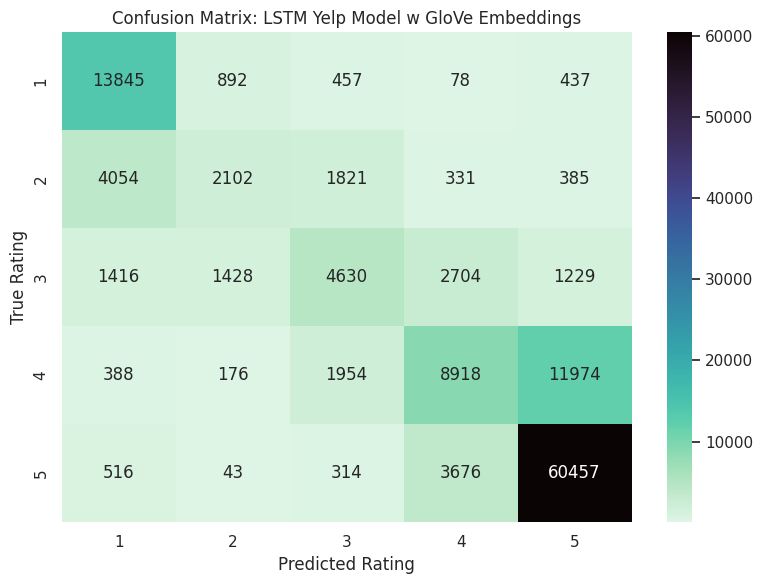

In [ ]:
model = load_model("/content/drive/MyDrive/Data_Science/DTSA 5506: Data Science Project/Yelp Project/yelp_lstm_model_with_GloVe.keras")

# Predict
y_pred_probs = model.predict(X_test_padded)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_encoded, axis=1)

report = classification_report(y_true_classes, y_pred_classes, target_names=["1 Star", "2 Stars", "3 Stars", "4 Stars", "5 Stars"])
print(report)

# Confusion matrix
cm = confusion_matrix(y_true_classes, y_pred_classes)

# Plot it
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='mako_r',
            xticklabels=[1, 2, 3, 4, 5],
            yticklabels=[1, 2, 3, 4, 5])
plt.xlabel("Predicted Rating")
plt.ylabel("True Rating")
plt.title("Confusion Matrix: LSTM Yelp Model w GloVe Embeddings")
plt.tight_layout()
plt.show()


Excited to see a fairly high test accuracy of `~72.4%`. Early stopping (hopefully) prevented overfitting by stopping at epoch 9, Just in case... I'm going to model without the GloVe embeddings. I suspect it might be possible that the GloVe data might not help the very specific type of data that Yelp reviews are.

### LSTM MODEL WITHOUT GloVe embeddings

In [ ]:
# Build the LSTM Model (no GloVe)
input_dim = 5000
embedding_dim = 100

model = Sequential([
    Embedding(input_dim=input_dim, output_dim=embedding_dim, input_length=max_sequence_length),
    LSTM(units=64, dropout=0.2, recurrent_dropout=0.2), # reduced from 128 to 64
    Dense(units=32, activation='relu'), # reduced from 64 to 32
    Dropout(0.5),
    Dense(units=y_train_encoded.shape[1], activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# Train the Model (no GloVe)
history = model.fit(
    X_train_padded,
    y_train_encoded,
    batch_size=32,
    epochs=10,
    validation_data=(X_test_padded, y_test_encoded),
    callbacks=[early_stopping],
    verbose=1
)
# Evaluate the Model
test_loss, test_accuracy = model.evaluate(X_test_padded, y_test_encoded)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


model.save("/content/drive/MyDrive/Data_Science/DTSA 5506: Data Science Project/Yelp Project/yelp_lstm_model_without_GloVe.keras")

Epoch 1/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 7462s 480ms/step - accuracy: 0.6685 - loss: 0.8337 - val_accuracy: 0.7222 - val_loss: 0.6718
Epoch 2/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 7450s 480ms/step - accuracy: 0.7177 - loss: 0.6887 - val_accuracy: 0.7286 - val_loss: 0.6536
Epoch 3/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 7468s 481ms/step - accuracy: 0.7273 - loss: 0.6661 - val_accuracy: 0.7288 - val_loss: 0.6541
Epoch 4/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 7499s 483ms/step - accuracy: 0.7333 - loss: 0.6486 - val_accuracy: 0.7331 - val_loss: 0.6526
Epoch 5/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 7525s 485ms/step - accuracy: 0.7376 - loss: 0.6353 - val_accuracy: 0.7329 - val_loss: 0.6596
Epoch 6/10
15529/15529 ━━━━━━━━━━━━━━━━━━━━ 7536s 485ms/step - accuracy: 0.7452 - loss: 0.6200 - val_accuracy: 0.7315 - val_loss: 0.6583
3883/3883 ━━━━━━━━━━━━━━━━━━━━ 389s 100ms/step - accuracy: 0.7350 - loss: 0.6470
Test Loss: 0.6526116132736206
Test Accuracy: 0.7330891489982605


Slightly higher accuracy score `~73.3%` without the GloVe embeddings

3883/3883 ━━━━━━━━━━━━━━━━━━━━ 80s 20ms/step
              precision    recall  f1-score   support

      1 Star       0.72      0.86      0.78     15709
     2 Stars       0.47      0.27      0.35      8693
     3 Stars       0.50      0.51      0.51     11407
     4 Stars       0.58      0.42      0.48     23410
     5 Stars       0.83      0.92      0.87     65006

    accuracy                           0.73    124225
   macro avg       0.62      0.60      0.60    124225
weighted avg       0.71      0.73      0.72    124225



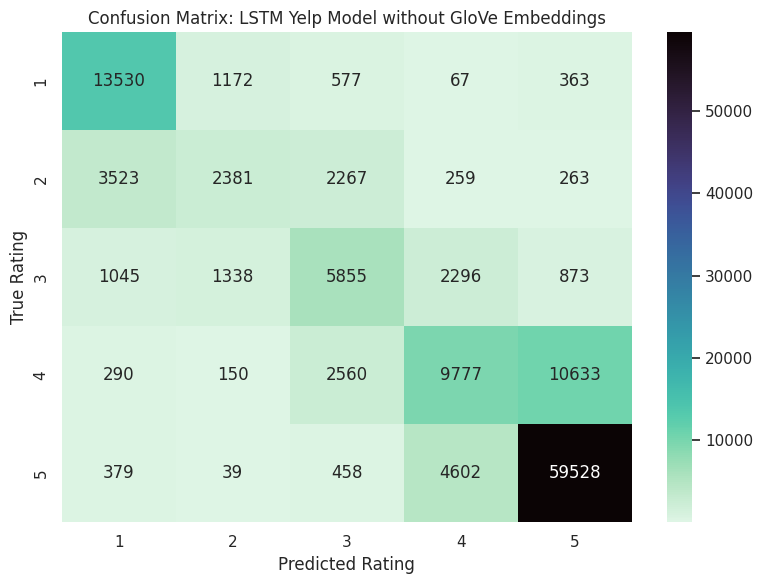

In [ ]:
model = load_model("/content/drive/MyDrive/Data_Science/DTSA 5506: Data Science Project/Yelp Project/yelp_lstm_model_without_GloVe.keras")

# Predict
y_pred_probs = model.predict(X_test_padded)
y_pred_classes = np.argmax(y_pred_probs, axis=1)
y_true_classes = np.argmax(y_test_encoded, axis=1)

report = classification_report(y_true_classes, y_pred_classes, target_names=["1 Star", "2 Stars", "3 Stars", "4 Stars", "5 Stars"])
print(report)

# Confusion matrix
cm = confusion_matrix(y_true_classes, y_pred_classes)

# Plot it
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='mako_r',
            xticklabels=[1, 2, 3, 4, 5],
            yticklabels=[1, 2, 3, 4, 5])
plt.xlabel("Predicted Rating")
plt.ylabel("True Rating")
plt.title("Confusion Matrix: LSTM Yelp Model without GloVe Embeddings")
plt.tight_layout()
plt.show()


<font face="helvetica" color=#3c734d size=5>**Model Evaluation**</font><br>
We use:
- **Accuracy**: How often the model predicts the correct star rating
- **Classification Report**: Precision, recall, and F1-score for each class
- **Confusion Matrix**: Visual summary of prediction errors and confusion across classes
<br>
<br>

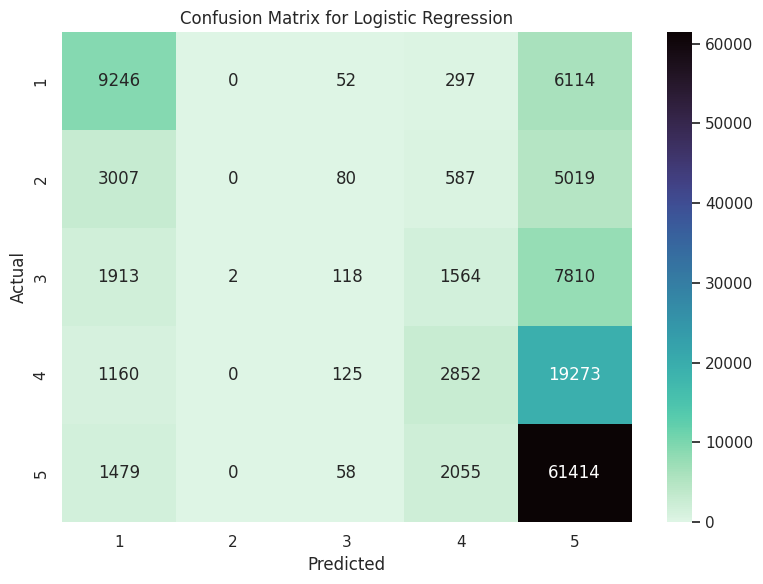

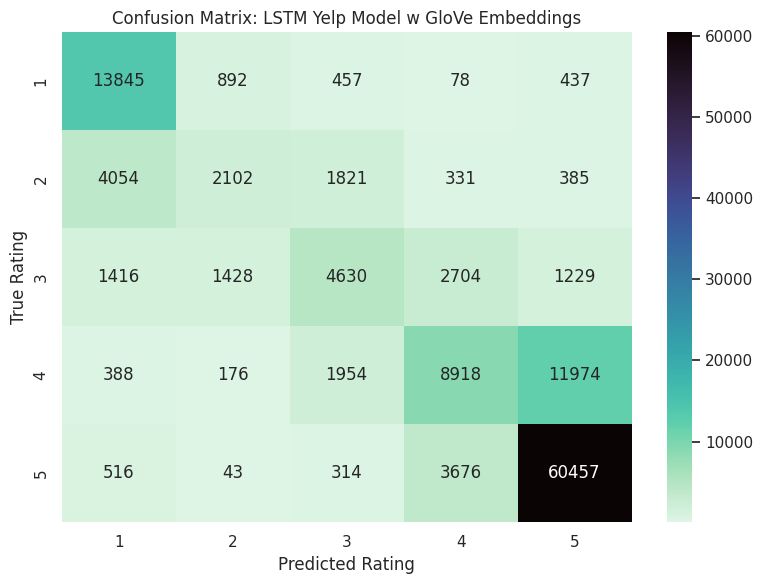

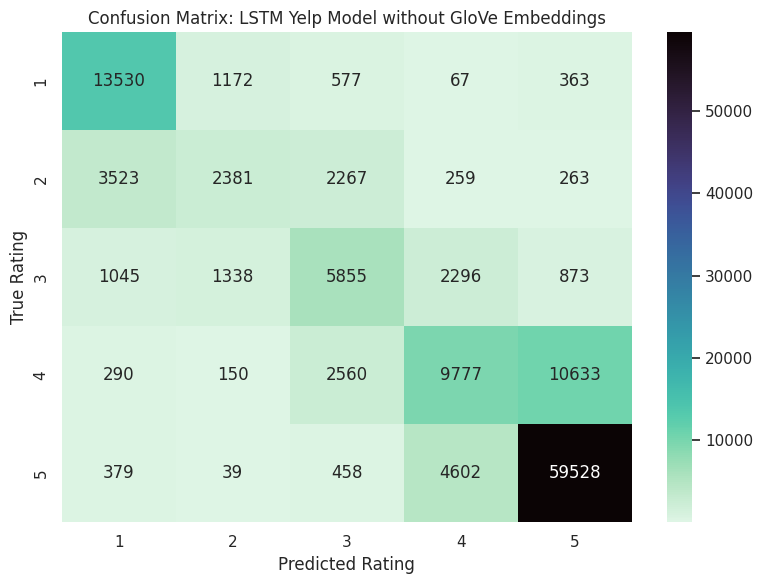

As the models perform better, the diagonal row in the confusion matrix gets "stronger". The logistic regression model did a great job properly classifying the 1-star ratings and the 5-star ratings but it performed very poorly on the others. Both LSTM models did a much better job properly classifying the 2s, 3s, and 4s (with a tiny loss in fidelity on either end of the spectrum). The LSTM model without the GloVe embeddings performed marginally better.



<font face="helvetica" color=#3c734d size=5>**Conclusion**</font><br>
- TF-IDF + Logistic Regression gives a fast, interpretable baseline
- LSTM with GloVe captures richer sequential patterns and reaches ~72% accuracy
- Topic modeling with NMF helps explore the dominant themes in the dataset

Next steps could include fine-tuning GloVe, using bidirectional LSTMs, or exploring transformer-based models like BERT.
<br>
<br>